# **Tutoria 1**

2º ano de Tecnologias Digitais e Inteligência Artificial - 2023/2024

Unidade Curricular: Aprendizagem Automática Não Supervisionada

Docente: António Raimundo

Beatriz Pinto, nº120053

Marianna Oliveira, nº120054

In [1]:
import pandas as pd
import numpy as np
import random
import ast
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
import seaborn as sns
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly.express as px
from umap import UMAP
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Índice
   [Introdução](#intro)
1. [Aquisição dos Dados](#dados)
3. [Data Wrangling](#wrangling)
4. [EDA](#eda)
5. [Machine Learning](#ml)
    1. [PCA](#p)
    2. [T-sne](#t)
    3. [UMAP](#u)
    4. [Kmeans](#km)
    5. [Aglomerative Clustering](#ac)
6. [Curiosidade ](#c)    
7. [Conclusão](#conclusion)

## Introdução<a name="intro"></a>

O nosso trabalho consiste no estudo de um dataset de audios disponíveis na plataforma de streaming Spotify. O estudo conta com Data Wrangling para limpeza dos dados, EDA para visualização das relações entre features e aplicação de algoritmos de aprendizagem não supervisionada. Com este último pretende-se observar padrões e pareçencas nas diversas músicas e agrupá-las, com o objetivo de ser possível criar listas de reprodução com músicas similares a partir de uma análise centrada no gênero musical.

## Aquisição dos dados<a name="dados"></a>

O dataset foi retirado da plataforma Kaggle (https://www.kaggle.com/datasets/vatsalmavani/spotify-dataset) e contém características de áudio e metadate de músicas presentes no Spotify.

## Data Wrangling<a name="wrangling"></a>

In [2]:
df_w_genres = pd.read_csv("data_w_genres.csv")
df = pd.read_csv("data.csv")

Em nenhum dos datasets exitem nulos ou dupilicados.

A coluna "artists" contêm os artistas presentes em cada faixa, para simplificar e facilitar a futura junção do dataset, vamos considerar o artista principal o que se encontra na primeira posição da lista.

In [3]:
def extract_main_artist(row):
    try:
        artists_list = ast.literal_eval(row['artists'])
        main_artist = artists_list[0] if artists_list else ""
    except Exception as e:
        print(f"Error: {e}")
        main_artist = ""
    return main_artist

df['artist'] = df.apply(extract_main_artist, axis=1)

df.drop('artists', axis=1, inplace=True)

df

,valence,year,acousticness,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,artist
0,0.0594,1921,0.98200,0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.6650,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954,Sergei Rachmaninoff
1,0.9630,1921,0.73200,0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.1600,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936,Dennis Day
2,0.0394,1921,0.96100,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.1010,-14.850,1,Gati Bali,5,1921,0.0339,110.339,KHP Kridhamardawa Karaton Ngayogyakarta Hadini...
3,0.1650,1921,0.96700,0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.3810,-9.316,1,Danny Boy,3,1921,0.0354,100.109,Frank Parker
4,0.2530,1921,0.95700,0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.2290,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665,Phil Regan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170648,0.6080,2020,0.08460,0.786,301714,0.808,0,0KkIkfsLEJbrcIhYsCL7L5,0.000289,7,0.0822,-3.702,1,China,72,2020-05-29,0.0881,105.029,Anuel AA
170649,0.7340,2020,0.20600,0.717,150654,0.753,0,0OStKKAuXlxA0fMH54Qs6E,0.000000,7,0.1010,-6.020,1,Halloweenie III: Seven Days,68,2020-10-23,0.0605,137.936,Ashnikko
170650,0.6370,2020,0.10100,0.634,211280,0.858,0,4BZXVFYCb76Q0Klojq4piV,0.000009,4,0.2580,-2.226,0,AYA,76,2020-11-03,0.0809,91.688,MAMAMOO
170651,0.1950,2020,0.00998,0.671,337147,0.623,1,5SiZJoLXp3WOl3J4C8IK0d,0.000008,2,0.6430,-7.161,1,Darkness,70,2020-01-17,0.3080,75.055,Eminem


Emboram não tenham sido detetados duplicados, exitem algumas instancias com todos os features iguais à excepcao do id:

In [4]:
diff_id = df.duplicated(subset=df.columns.difference(['id'])).sum()

print("Musicas que só têm id diferente :" ,diff_id)

Musicas que só têm id diferente : 557


In [5]:
df_original = df.drop_duplicates(subset=df.columns.difference(['id']))

Vamos ainda averiguar a existência de músicas com artistas desconhecidos - possuem o valor "Unspecified", e passar à sua eliminação

In [6]:
desconhecidos = df_original[df_original['artist'].apply(lambda x: "Unspecified" in x)]

print("Músicas com artista desconhecidos")
desconhecidos


Músicas com artista desconhecidos


,valence,year,acousticness,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,artist
6339,0.9620,1953,0.909,0.556,138987,0.8940,0,3yIisHpj3BBjmF1y155PpE,0.865000,11,0.0694,-6.150,1,Bata Drums,15,1953-01-01,0.0776,148.590,Unspecified
6767,0.2180,1955,0.898,0.535,226707,0.1470,0,1aK47pO8onYCEMZLrNaBQd,0.004800,9,0.2950,-18.668,1,Ninna Ninna - Lullaby,26,1955-01-01,0.0315,109.934,Unspecified
24828,0.4730,1951,0.994,0.565,102533,0.1950,0,3Hd9xFHexRb2CGBQdU015T,0.013300,2,0.3490,-18.389,0,"Navajo: Night Chant, Yeibichai Dance",8,1951-01-01,0.1360,96.905,Unspecified
43511,0.3260,1951,0.841,0.541,104667,0.0648,0,11c0xkIUPgAa4fnmDPrl8p,0.000004,7,0.2290,-17.271,0,Lament for Dead Brother - Bocet,1,1951-01-01,0.3440,105.007,Unspecified
43548,0.2190,1951,0.551,0.536,183147,0.3790,0,3KKUis1DShvMFAcUXJrqKc,0.007400,0,0.2550,-15.607,0,Prayer of Absolution 01465A1,1,1951-01-01,0.0296,95.756,Unspecified
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157411,0.0556,1954,0.901,0.645,79133,0.6870,0,0mFC2hlYVn1Rp3hlEMoiqO,0.000000,8,0.8680,-19.825,0,Preparation for Baptism Table (Revival Zion),0,1954-01-01,0.5160,131.482,Unspecified
157423,0.3330,1954,0.661,0.392,74893,0.3420,0,0nOtFj68lWrzAIfmFPBKaK,0.078700,10,0.3460,-21.006,1,Chorus Line,0,1954-01-01,0.0599,82.268,Unspecified
157436,0.8570,1954,0.963,0.515,130453,0.3710,0,0oEGVysnPL7qFtuta7GeyZ,0.830000,8,0.5920,-16.913,1,Social Dance Music,0,1954-01-01,0.1150,119.380,Unspecified
157526,0.0387,1954,0.563,0.407,114653,0.5580,0,0wtwXsj8LGYoPYdwBjvtaf,0.000000,10,0.7550,-21.094,0,Ras Tafari Youth Group (We Are Going Home),0,1954-01-01,0.0394,129.000,Unspecified


In [7]:
desconhecidos_index = desconhecidos.index

df = df.drop(desconhecidos_index)

df

,valence,year,acousticness,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,artist
0,0.0594,1921,0.98200,0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.6650,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954,Sergei Rachmaninoff
1,0.9630,1921,0.73200,0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.1600,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936,Dennis Day
2,0.0394,1921,0.96100,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.1010,-14.850,1,Gati Bali,5,1921,0.0339,110.339,KHP Kridhamardawa Karaton Ngayogyakarta Hadini...
3,0.1650,1921,0.96700,0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.3810,-9.316,1,Danny Boy,3,1921,0.0354,100.109,Frank Parker
4,0.2530,1921,0.95700,0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.2290,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665,Phil Regan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170648,0.6080,2020,0.08460,0.786,301714,0.808,0,0KkIkfsLEJbrcIhYsCL7L5,0.000289,7,0.0822,-3.702,1,China,72,2020-05-29,0.0881,105.029,Anuel AA
170649,0.7340,2020,0.20600,0.717,150654,0.753,0,0OStKKAuXlxA0fMH54Qs6E,0.000000,7,0.1010,-6.020,1,Halloweenie III: Seven Days,68,2020-10-23,0.0605,137.936,Ashnikko
170650,0.6370,2020,0.10100,0.634,211280,0.858,0,4BZXVFYCb76Q0Klojq4piV,0.000009,4,0.2580,-2.226,0,AYA,76,2020-11-03,0.0809,91.688,MAMAMOO
170651,0.1950,2020,0.00998,0.671,337147,0.623,1,5SiZJoLXp3WOl3J4C8IK0d,0.000008,2,0.6430,-7.161,1,Darkness,70,2020-01-17,0.3080,75.055,Eminem


Juntamos os dois datasets com base no artista, atribuindo o género de um artista a todas as suas músicas:

In [8]:
df_merged = pd.merge(df, df_w_genres[['artists', 'genres']], how='inner', left_on='artist', right_on='artists')

df_merged.drop('artists', axis=1, inplace=True)

(df_merged)

,valence,year,acousticness,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,artist,genres
0,0.0594,1921,0.98200,0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.6650,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954,Sergei Rachmaninoff,"['classical', 'post-romantic era', 'russian ro..."
1,0.9630,1921,0.73200,0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.1600,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936,Dennis Day,[]
2,0.0394,1921,0.96100,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.1010,-14.850,1,Gati Bali,5,1921,0.0339,110.339,KHP Kridhamardawa Karaton Ngayogyakarta Hadini...,[]
3,0.1650,1921,0.96700,0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.3810,-9.316,1,Danny Boy,3,1921,0.0354,100.109,Frank Parker,[]
4,0.2530,1921,0.95700,0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.2290,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665,Phil Regan,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170437,0.6080,2020,0.08460,0.786,301714,0.808,0,0KkIkfsLEJbrcIhYsCL7L5,0.000289,7,0.0822,-3.702,1,China,72,2020-05-29,0.0881,105.029,Anuel AA,"['latin', 'reggaeton', 'reggaeton flow', 'trap..."
170438,0.7340,2020,0.20600,0.717,150654,0.753,0,0OStKKAuXlxA0fMH54Qs6E,0.000000,7,0.1010,-6.020,1,Halloweenie III: Seven Days,68,2020-10-23,0.0605,137.936,Ashnikko,['pop']
170439,0.6370,2020,0.10100,0.634,211280,0.858,0,4BZXVFYCb76Q0Klojq4piV,0.000009,4,0.2580,-2.226,0,AYA,76,2020-11-03,0.0809,91.688,MAMAMOO,"['k-pop', 'k-pop girl group']"
170440,0.1950,2020,0.00998,0.671,337147,0.623,1,5SiZJoLXp3WOl3J4C8IK0d,0.000008,2,0.6430,-7.161,1,Darkness,70,2020-01-17,0.3080,75.055,Eminem,"['detroit hip hop', 'hip hop', 'rap']"


Averiguamos a existência de músicas sem género, de dois modos diferentes:

In [9]:
missing_genres = df_merged[df_merged['genres'].isna()]
missing_genres

,valence,year,acousticness,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,artist,genres


In [10]:
#remover tracks sem  género
df_merged = df_merged[df_merged['genres'] != '[]']
df_merged.reset_index(drop=True, inplace=True)

df_merged

,valence,year,acousticness,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,artist,genres
0,0.0594,1921,0.98200,0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.6650,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954,Sergei Rachmaninoff,"['classical', 'post-romantic era', 'russian ro..."
1,0.4060,1921,0.99600,0.518,159507,0.203,0,5uNZnElqOS3W4fRmRYPk4T,0.000000,0,0.1150,-10.589,1,The Wearing of the Green,4,1921,0.0615,66.221,John McCormack,"['irish ballad', 'vintage classical singing']"
2,0.0731,1921,0.99300,0.389,218773,0.088,0,02GDntOXexBFUvSgaXLPkd,0.527000,1,0.3630,-21.091,0,"Morceaux de fantaisie, Op. 3: No. 2, Prélude i...",2,1921,0.0456,92.867,Sergei Rachmaninoff,"['classical', 'post-romantic era', 'russian ro..."
3,0.7210,1921,0.99600,0.485,161520,0.130,0,05xDjWH9ub67nJJk82yfGf,0.151000,5,0.1040,-21.508,0,La Mañanita - Remasterizado,0,1921-03-20,0.0483,64.678,Ignacio Corsini,"['tango', 'vintage tango']"
4,0.7710,1921,0.98200,0.684,196560,0.257,0,08zfJvRLp7pjAb94MA9JmF,0.000000,8,0.5040,-16.415,1,Il Etait Syndiqué,0,1921,0.3990,109.378,Fortugé,['vintage chanson']
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153050,0.6080,2020,0.08460,0.786,301714,0.808,0,0KkIkfsLEJbrcIhYsCL7L5,0.000289,7,0.0822,-3.702,1,China,72,2020-05-29,0.0881,105.029,Anuel AA,"['latin', 'reggaeton', 'reggaeton flow', 'trap..."
153051,0.7340,2020,0.20600,0.717,150654,0.753,0,0OStKKAuXlxA0fMH54Qs6E,0.000000,7,0.1010,-6.020,1,Halloweenie III: Seven Days,68,2020-10-23,0.0605,137.936,Ashnikko,['pop']
153052,0.6370,2020,0.10100,0.634,211280,0.858,0,4BZXVFYCb76Q0Klojq4piV,0.000009,4,0.2580,-2.226,0,AYA,76,2020-11-03,0.0809,91.688,MAMAMOO,"['k-pop', 'k-pop girl group']"
153053,0.1950,2020,0.00998,0.671,337147,0.623,1,5SiZJoLXp3WOl3J4C8IK0d,0.000008,2,0.6430,-7.161,1,Darkness,70,2020-01-17,0.3080,75.055,Eminem,"['detroit hip hop', 'hip hop', 'rap']"


De acordo com o website "Spotiy for Developers:
"Values above 0.66 describe tracks that are probably made entirely of spoken words."

In [11]:
song_like_songs = df_merged[df_merged['speechiness'] > 0.66]

print("Songs with less speechiness:")
song_like_songs[['name', 'artist', 'speechiness']]

Songs with less speechiness:


,name,artist,speechiness
753,La Piba Del Tabaris - Remasterizado,Francisco Canaro,0.859
896,Es geht mir in jeder Hinsicht immer besser,Otto Reutter,0.743
1048,Capítulo 7.3 - la Casa Maldita,H.P. Lovecraft,0.945
1053,Capítulo 1.4 - la Casa Maldita,H.P. Lovecraft,0.946
1056,Capítulo 1.1 - la Casa Maldita,H.P. Lovecraft,0.927
...,...,...,...
151172,The Parking Ticket,Patton Oswalt,0.891
151482,Special Victims And Ice-T,John Mulaney,0.950
152889,BOOTY CALL (skit),The Kid LAROI,0.871
152954,"The Man, The Myth, The Legend - Interlude",Juice WRLD,0.761


Com base nos nomes obtidos, podemos concluir que estes instances provavelmente não são músicas mas sim audios de "palavras faladas" como skits, interlúdios ou audiobooks. Assim, vamos proceder à eliminação destes, uma vez que o nosso estudo baseia -se na análise de músicas. 

Nota: este dataset possui faixas de audio e não exclusivamente músicas

In [12]:
df_merged = df_merged[df_merged["speechiness"] < 0.66]
len(df_merged)

151844

Vamos ainda remover algumas colunas, consideradas irrelevantes. O id e o release date, mantemos a coluna year, para que possam ser feitas associações com base na altura do lançamento.

In [13]:
#df_original = df_original.drop(columns = ["id", "artists","name","release_date"])
df_merged = df_merged.drop(columns = ["id","release_date"])
df_merged

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artist,genres
0,0.0594,1921,0.98200,0.279,831667,0.211,0,0.878000,10,0.6650,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,0.0366,80.954,Sergei Rachmaninoff,"['classical', 'post-romantic era', 'russian ro..."
1,0.4060,1921,0.99600,0.518,159507,0.203,0,0.000000,0,0.1150,-10.589,1,The Wearing of the Green,4,0.0615,66.221,John McCormack,"['irish ballad', 'vintage classical singing']"
2,0.0731,1921,0.99300,0.389,218773,0.088,0,0.527000,1,0.3630,-21.091,0,"Morceaux de fantaisie, Op. 3: No. 2, Prélude i...",2,0.0456,92.867,Sergei Rachmaninoff,"['classical', 'post-romantic era', 'russian ro..."
3,0.7210,1921,0.99600,0.485,161520,0.130,0,0.151000,5,0.1040,-21.508,0,La Mañanita - Remasterizado,0,0.0483,64.678,Ignacio Corsini,"['tango', 'vintage tango']"
4,0.7710,1921,0.98200,0.684,196560,0.257,0,0.000000,8,0.5040,-16.415,1,Il Etait Syndiqué,0,0.3990,109.378,Fortugé,['vintage chanson']
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153050,0.6080,2020,0.08460,0.786,301714,0.808,0,0.000289,7,0.0822,-3.702,1,China,72,0.0881,105.029,Anuel AA,"['latin', 'reggaeton', 'reggaeton flow', 'trap..."
153051,0.7340,2020,0.20600,0.717,150654,0.753,0,0.000000,7,0.1010,-6.020,1,Halloweenie III: Seven Days,68,0.0605,137.936,Ashnikko,['pop']
153052,0.6370,2020,0.10100,0.634,211280,0.858,0,0.000009,4,0.2580,-2.226,0,AYA,76,0.0809,91.688,MAMAMOO,"['k-pop', 'k-pop girl group']"
153053,0.1950,2020,0.00998,0.671,337147,0.623,1,0.000008,2,0.6430,-7.161,1,Darkness,70,0.3080,75.055,Eminem,"['detroit hip hop', 'hip hop', 'rap']"


Podemos observar que os géneros estão definido como um array, sendo possível verificar que o primeiro elemento é um género mais geral com os restantes a especificar-lo. Assim, para facilitar a análise vamos alterar a coluna genres para genre de modo a que só mostre o género principal.

In [14]:
def extract_main_genre(row):
    try:
        genres_list = ast.literal_eval(row['genres'])
        main = genres_list[0] if genres_list else ""
    except Exception as e:
        print(f"Error: {e}")
        main = ""
    return main

df_merged['genre'] = df_merged.apply(extract_main_genre, axis=1)

df_merged.drop('genres', axis=1, inplace=True)


In [15]:
df_merged

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artist,genre
0,0.0594,1921,0.98200,0.279,831667,0.211,0,0.878000,10,0.6650,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,0.0366,80.954,Sergei Rachmaninoff,classical
1,0.4060,1921,0.99600,0.518,159507,0.203,0,0.000000,0,0.1150,-10.589,1,The Wearing of the Green,4,0.0615,66.221,John McCormack,irish ballad
2,0.0731,1921,0.99300,0.389,218773,0.088,0,0.527000,1,0.3630,-21.091,0,"Morceaux de fantaisie, Op. 3: No. 2, Prélude i...",2,0.0456,92.867,Sergei Rachmaninoff,classical
3,0.7210,1921,0.99600,0.485,161520,0.130,0,0.151000,5,0.1040,-21.508,0,La Mañanita - Remasterizado,0,0.0483,64.678,Ignacio Corsini,tango
4,0.7710,1921,0.98200,0.684,196560,0.257,0,0.000000,8,0.5040,-16.415,1,Il Etait Syndiqué,0,0.3990,109.378,Fortugé,vintage chanson
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153050,0.6080,2020,0.08460,0.786,301714,0.808,0,0.000289,7,0.0822,-3.702,1,China,72,0.0881,105.029,Anuel AA,latin
153051,0.7340,2020,0.20600,0.717,150654,0.753,0,0.000000,7,0.1010,-6.020,1,Halloweenie III: Seven Days,68,0.0605,137.936,Ashnikko,pop
153052,0.6370,2020,0.10100,0.634,211280,0.858,0,0.000009,4,0.2580,-2.226,0,AYA,76,0.0809,91.688,MAMAMOO,k-pop
153053,0.1950,2020,0.00998,0.671,337147,0.623,1,0.000008,2,0.6430,-7.161,1,Darkness,70,0.3080,75.055,Eminem,detroit hip hop


#### Em suma...

Na porção de data wrangling foram feitas verificações e alterações sobre o dataset de modo a possibilitar que sejam cumpridos os objetivos deste trabalho, nomeadamente:


- Foram importados dois datasets data e data_w_genres, o primeiro tem informações sobre faixas de audio e o segundo tem informações sobre os artistas destas.

- Como os artistas aparecem em lista, foi extraido o artista principal - o que aparece na primeira posição no array.
- Foram apagados elementos nulos e duplicados.

- Foram apagadas faixas com o artista "Unspecified".

- Fora apagadas faixas com uma speechiness acima de 0.66 - uma vez que estas muito provavelmente não são músicas mas outro tipo audios (audiobooks, interludios de concertos, skits, ...).

- Foram eliminadas música repetidas que não aparciam como duplicados - todos os features eram iguais exceto o id.

- Juntou-se os dois datasets com base no artista - todas as músicas de um artista obtiveram o género musical associado este.

- Foram eliminadas todas as músicas sem género - [] na coluna.

- Foi extraido o género mais geral, passando a coluna genres a genre, com uma String.

- Foram eliminadas as colunas id e release_date - consideradas irrelevantes.

## EDA<a name="wrangling"></a>

Sobre os Features numericos, que caractarizam uma musica

- Accousticness: quão acustica uma música é. Músicas com instrumental mais suave têm um valor superior, enquanto músicas com instrumentos elétricos e vocais mais agressivas têm um valor mais baixo.

- Danceability: quão adequada uma música é para dançar.

- Energy: mede a intensidade de uma música.

- Instrumentalness: quão instrumental uma música é. Músicas sem vocais, terão um valor mais alto.

- Liveness: mede a possibilidade de uma gravação ter sido feito perante uma audiência.

- Loudness: quão alta uma música é.

- Speechiness: como já falado na porção de Data Wrangling, mede a quantidade de "spoken word" numa canção (o contrário de instrumentalness)

- Valence: quão feliz o melancólica, uma música é.

- Tempo: a velocidade de uma música em bpm (beats for minute)

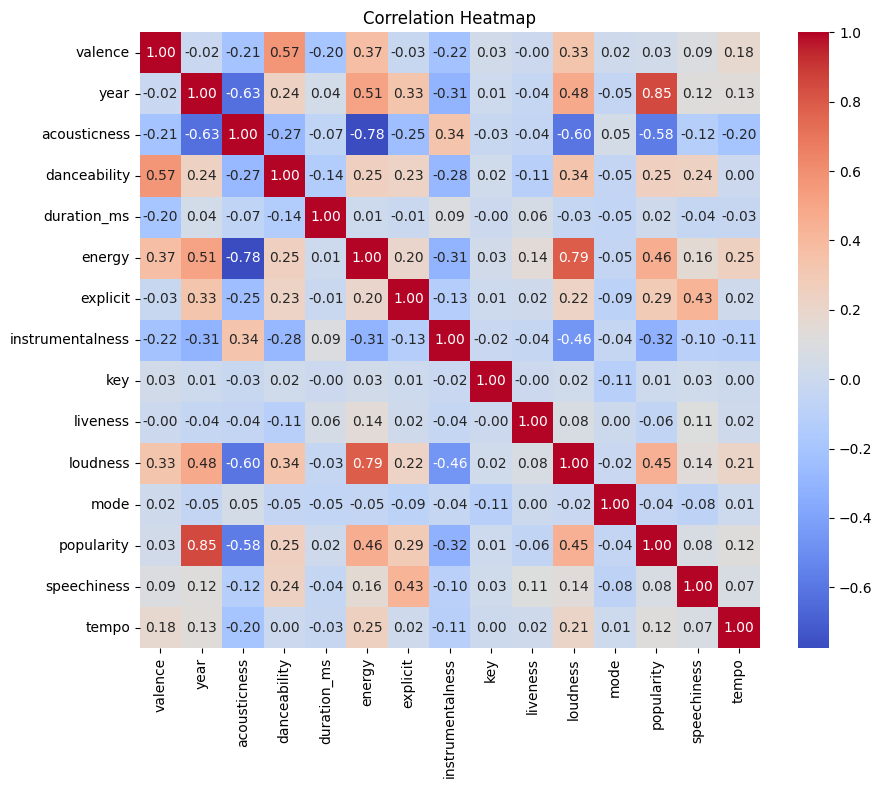

In [16]:
df_valor = df_merged.select_dtypes(include=['int64', 'float64'])

correlation_matrix = df_valor.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

Com base no heatmap acima, podemos observar:

- Uma relação forte entre loudness e energy, músicas mais 'altas' são por norma também, mais energéticas. Esta razao justifica também a relação entre loudness e accousticness

- Uma relação forte entre a popularidade e o ano em que a musica foi lancada, com as músicas mais lancadas em anos mais recentes a ter maior popularidade - explorado mais abaixo - talvez devido ao facto de que a popularidade que está a ser quantificada ser feita com base no número de ouvintes no spotify, usado por pessoas mais novas.

- Uma relação entre valence e danceability, o que não é surpreendente uma vez que as músicas que mais levam a dançar serem mais felizes (o que valence mede).



In [17]:
df_merged['decade'] = ((df_merged['year'] - 1)//10)*10
df_merged['decade'] = ((df_merged['year'] - 1)//10)*10

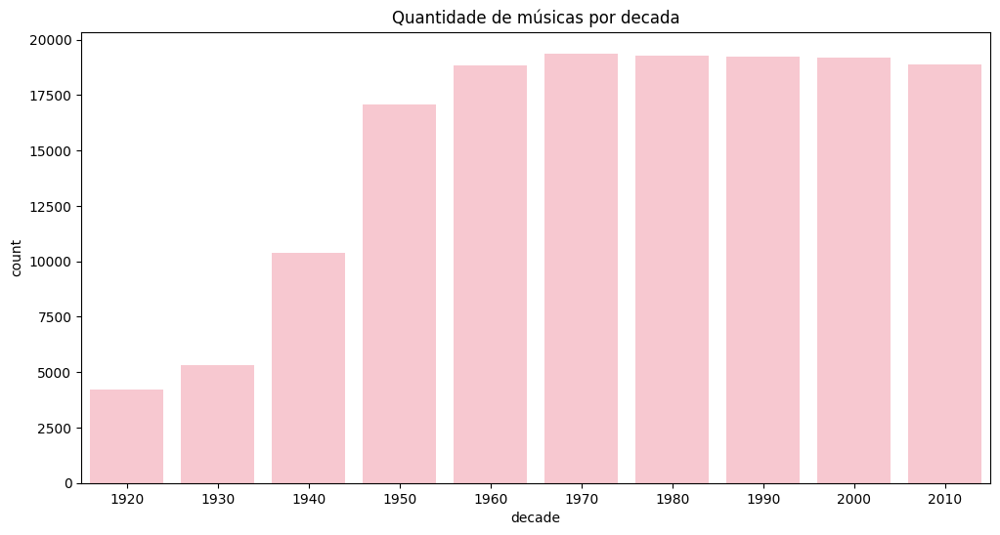

In [18]:
plt.figure(figsize=(12,6))
sns.countplot(x='decade', data=df_merged, color='pink')
plt.title('Quantidade de músicas por decada')
plt.show()

/var/folders/7x/jzz8zkp55cb7t6rp3hdj_b0r0000gn/T/ipykernel_4332/173250700.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='decade', y='popularity', data=df_merged, palette='Paired')


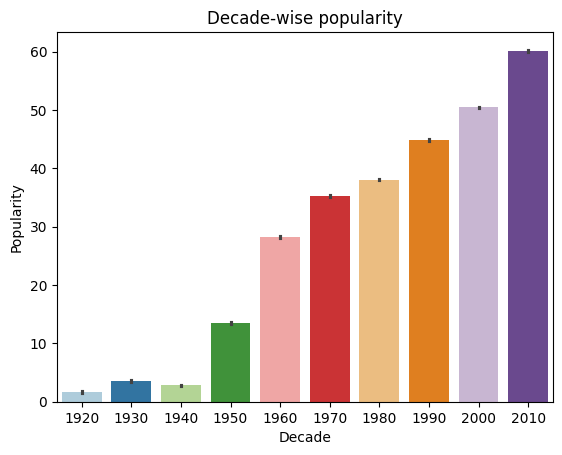

In [19]:
sns.barplot(x='decade', y='popularity', data=df_merged, palette='Paired')
plt.title('Decade-wise popularity')
plt.xlabel('Decade')
plt.ylabel('Popularity')
plt.show()

/var/folders/7x/jzz8zkp55cb7t6rp3hdj_b0r0000gn/T/ipykernel_4332/3931282536.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  popular_genres['genre'] = popular_genres['genre']
/var/folders/7x/jzz8zkp55cb7t6rp3hdj_b0r0000gn/T/ipykernel_4332/3931282536.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='genre', y='popularity', data=mean_popularity.head(10), palette='viridis')


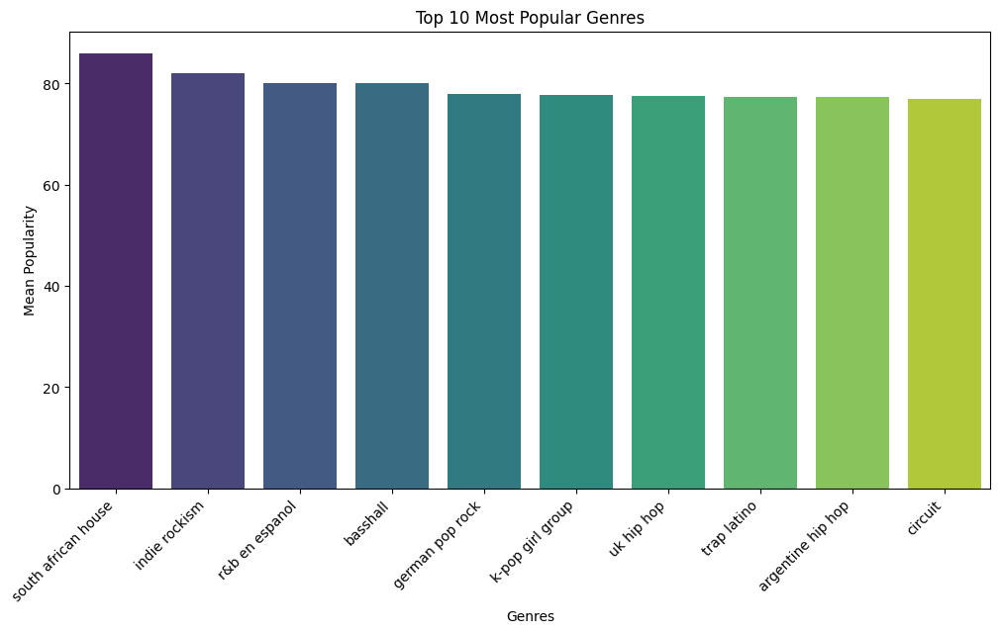

In [20]:
popular_genres = df_merged[['genre', 'popularity']]

popular_genres['genre'] = popular_genres['genre']
popular_genres = popular_genres.explode('genre')

mean_popularity = popular_genres.groupby('genre')['popularity'].mean().reset_index()

mean_popularity = mean_popularity.sort_values(by='popularity', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x='genre', y='popularity', data=mean_popularity.head(10), palette='viridis')
plt.xlabel('Genres')
plt.ylabel('Mean Popularity')
plt.title('Top 10 Most Popular Genres')
plt.xticks(rotation=45, ha='right')
plt.show()


In [21]:
df_merged['genre'] = df_merged['genre'].replace('album rock', 'rock')

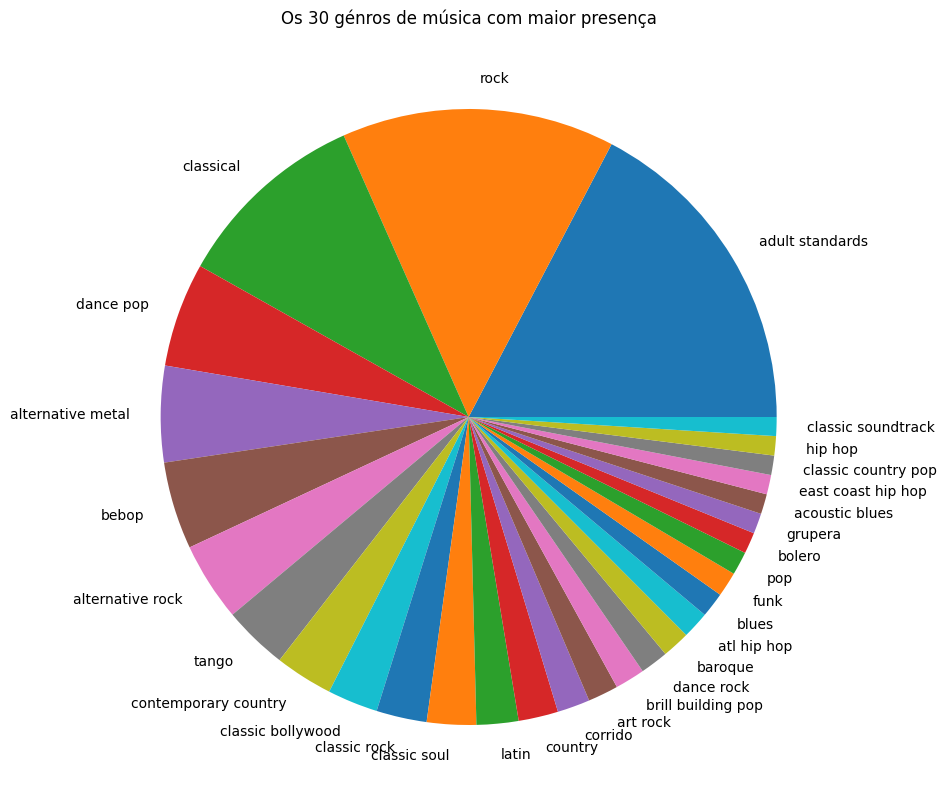

In [22]:
fig = plt.figure(figsize=(10, 10))
ax = fig.subplots()
df_merged['genre'].value_counts()[:30].plot(ax=ax, kind="pie")
ax.set_ylabel("")
ax.set_title("Os 30 génros de música com maior presença")
plt.show()

Adult Standards: género de música que inclui músicas conhecidas entre 1920 e 1980, inclui vários tipos de subgeneros, como jazz, showtune e pop tradicional - geralmente considerada música calma e relaxante.

Bebop: género representa uma das correntes mais influentes do Jazz

## Machine Learning<a name="ml"></a>

#### Preparação do Dataset

In [23]:
top_6_genres = df_merged['genre'].value_counts().nlargest(6).index.tolist()

df_top_6_genres = df_merged[df_merged['genre'].isin(top_6_genres)].copy()

df_top_6_genres.reset_index(drop=True, inplace=True)

df_final = df_top_6_genres

df_final.drop('year', axis=1, inplace=True)


Para o nosso dataset final, preservamos apenas as músicas dos géneros mais comuns no dataset inicial, a fim de podermos analisar se os clusters conseguem através de diferentes features analisar o género de uma música. Passamos de ter aproximadamente 150 000 para 50 000. 

Para além disto, preservamos apenas os 6 géneros mais comuns a fim de facilitar a futura análise de gráficos, a fim de averiguarmos se com os features é possível identificar o género musical.

In [24]:
#label_encoder = LabelEncoder()
#df_final['genre_encoded'] = label_encoder.fit_transform(df_final['genre'])
print("Dataset final:")
df_final


Dataset final:


,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artist,genre,decade
0,0.0594,0.982000,0.279,831667,0.211,0,0.878000,10,0.6650,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,0.0366,80.954,Sergei Rachmaninoff,classical,1920
1,0.0731,0.993000,0.389,218773,0.088,0,0.527000,1,0.3630,-21.091,0,"Morceaux de fantaisie, Op. 3: No. 2, Prélude i...",2,0.0456,92.867,Sergei Rachmaninoff,classical,1920
2,0.2820,0.989000,0.384,221013,0.171,0,0.820000,7,0.1160,-20.476,0,"10 Préludes, Op. 23: No. 5 in G Minor. Alla ma...",4,0.0319,107.698,Sergei Rachmaninoff,classical,1920
3,0.6640,0.996000,0.541,250747,0.283,0,0.898000,9,0.3930,-14.808,1,Rákóczy March,0,0.0477,108.986,Hector Berlioz,classical,1920
4,0.0731,0.993000,0.389,218773,0.088,0,0.527000,1,0.3630,-21.091,0,"Morceaux de fantaisie, Op. 3: No. 2, Prélude i...",0,0.0456,92.867,Sergei Rachmaninoff,classical,1920
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48377,0.7670,0.000380,0.628,185320,0.830,0,0.000025,7,0.0982,-4.752,1,Money Shot,67,0.0626,120.004,AC/DC,rock,2010
48378,0.3050,0.469000,0.702,179653,0.744,0,0.000000,6,0.0915,-4.063,0,WOW (feat. Sabrina Carpenter) - Remix,73,0.0861,77.486,Zara Larsson,dance pop,2010
48379,0.7900,0.133000,0.470,209583,0.785,0,0.000002,5,0.0931,-4.015,0,Cool,72,0.0664,89.717,Dua Lipa,dance pop,2010
48380,0.3230,0.000206,0.407,290768,0.872,0,0.045100,7,0.1270,-5.001,1,Zombie (Live from the NIVA Save Our Stages Fes...,71,0.0354,164.000,Miley Cyrus,dance pop,2010


Vamos apenas trabalhar com os features numéricos, deixando de parte "name", "artist" e "genre", este ultimo vai agir como o nosso target.

In [25]:
df_numeric = df_final.select_dtypes(include=['int64', 'float64'])

scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_numeric)


### PCA<a name="p"></a>

In [26]:
pca = PCA(n_components=4) 
principal_components = pca.fit_transform(df_scaled)

df_pca = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3', 'PC4'])

df_pca.head()

,PC1,PC2,PC3,PC4
0,4.111176,2.747378,1.652404,-0.901517
1,3.658222,0.021791,0.882096,0.438273
2,3.472286,-0.358414,0.166758,1.329727
3,2.441702,-1.407309,1.472259,0.053551
4,3.693706,0.003430,0.911966,0.433026


Explained Variance:  [0.30653553 0.09889641 0.08213139 0.07506456]


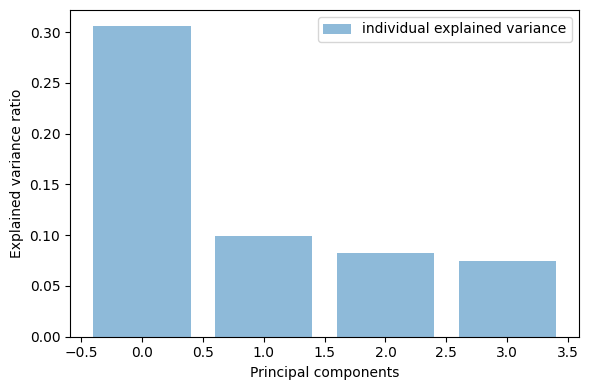

In [27]:
explained_variance = pca.explained_variance_ratio_
print("Explained Variance: ",explained_variance)

plt.figure(figsize=(6, 4))
plt.bar(range(4), explained_variance, alpha=0.5, align='center', label='individual explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.legend(loc='best')
plt.tight_layout()

O componente 1 explica 30% da variância

O componente 2 explica 9% da variância

O componente 3 explica 8% da variância

O componente 4 explica 7% da variância


In [28]:
pca = PCA(n_components=len(df_numeric.columns))
pca.fit(df_numeric)

components_df = pd.DataFrame(pca.components_.T, 
                             columns=[f'PC{i+1}' for i in range(len(df_numeric.columns))], 
                             index=df_numeric.columns)

print(components_df[['PC1', 'PC2']])


                           PC1       PC2
valence          -4.320041e-07 -0.002338
acousticness     -5.638837e-08  0.006706
danceability     -2.344934e-07 -0.001070
duration_ms       1.000000e+00 -0.000010
energy           -5.499248e-08 -0.004895
explicit         -1.203093e-08 -0.000912
instrumentalness  4.192878e-07  0.003207
key              -3.887956e-07 -0.000772
liveness          2.451741e-08 -0.000099
loudness         -2.810288e-06 -0.092815
mode             -1.217464e-07  0.000265
popularity       -7.097178e-06 -0.371142
speechiness      -1.901126e-08 -0.000228
tempo            -8.624505e-06 -0.821814
decade           -1.135516e-06 -0.422105


PCA1 tem maior relação com tempo e popularity e
PCA2 tem maior relação com tempo e decada, com valor de correl elevado quanto à popularidade

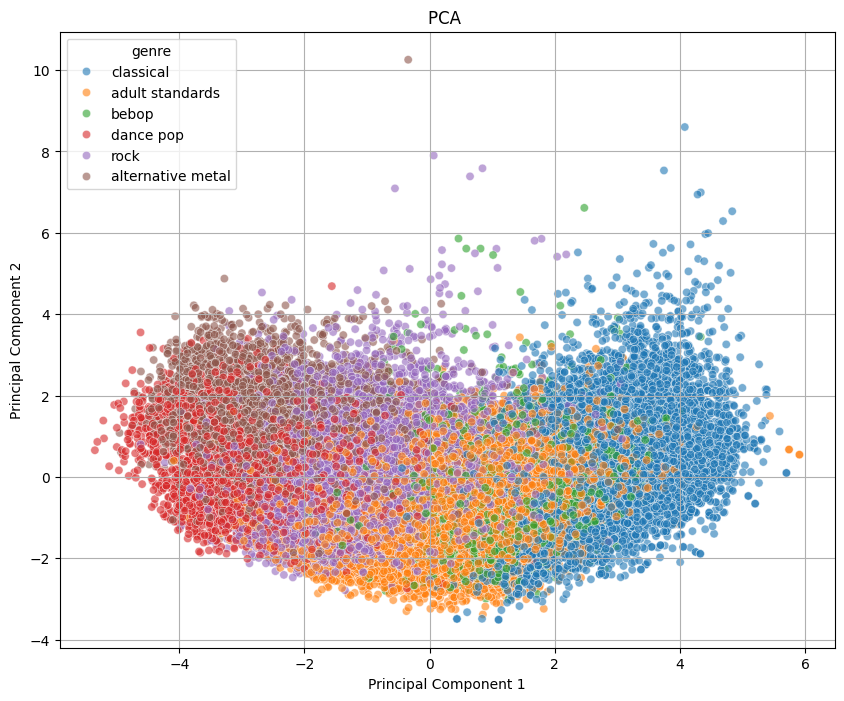

In [29]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue = df_final['genre'], alpha=0.6)
plt.title('PCA ')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()


O **PCA** não foi bom a criar clusters identificáveis. No entanto, conseguimos observar que as músicas de géneros semelhantes mantêm-se próximas, destacamos a música clássica que aparenta estar muito bem isolada.

### T-SNE<a name="t"></a>

In [30]:

tsne = TSNE(n_components=2, perplexity=30, random_state=1, n_jobs=-1)
df_tsne = tsne.fit_transform(df_scaled)

df_tsne = pd.DataFrame(df_tsne, columns=['Embedding 1', 'Embedding 2'])

df_tsne['genre'] = df_final['genre']

fig = px.scatter(df_tsne, x='Embedding 1', y='Embedding 2', color='genre', width=800, height=600)
fig.update_layout(
    title="T-SNE Visualization",
    xaxis_title="Embedding 1",
    yaxis_title="Embedding 2",
)
fig.show()

Com a redução de dimensionalidade T-sne, já conseguimos observar alguns cluster. É ainda, possível analisar a distribuição dos diferentes géneros, que não é tão intuitiva como no PCA.

In [31]:
df_tsne.drop('genre', axis=1, inplace=True)

In [32]:
tsne.kl_divergence_

2.754490852355957

### UMAP<a name="u"></a>

In [33]:
embedding = UMAP(random_state=42).fit_transform(df_scaled)
df_umap = pd.DataFrame(embedding,columns=["Embedding 1","Embedding 2"])

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



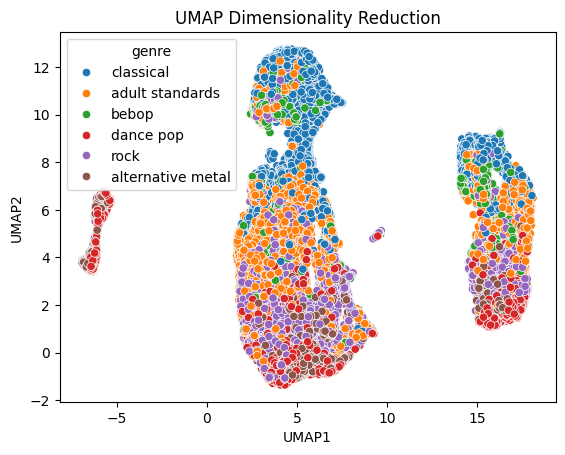

In [34]:
sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1],hue = df_final['genre'])
plt.title('UMAP Dimensionality Reduction', fontsize=12)
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.show()

Embora os clusters sejam mais visiveis, a distribuição dos géneros aparenta não estar concentrada em nenhum cluster especifico. Embora, seja possível uma ligeira segmentação.

#### Em suma...

| Metodo | PCA | t-SNE | UMAP |
| ------ | --- | ---- | ----- |
| Clusters | Não | Sim | Sim |
| Intrepretação | Média | Baixa | Média |
| Utilidade na Análise de Género | Média | Média | Baixa |
| Adequabilidade para Playlists | Baixa | Média | Alta |
| Complexidade Computacional | Baixa | Alta | Média |

*Comparação dos métodos de redução de dimensionalidade *


### Kmeans<a name="km"></a>

In [35]:
# Funções auxiliares

# Elbow method
def elbow(df):
    WCSS = []
    K = range(1,10)
    for num_clusters in K :
        kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=1)
        kmeans.fit(df)
        WCSS.append(kmeans.inertia_)

    fig = plt.figure(figsize = (5,5))
    plt.plot(K,WCSS)

#Silhoette score
def silhouette(df):
    SC = []
    K = range(2,10)
    for num_clusters in K:
       kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=1)
       kmeans.fit(df)
       cluster_labels = kmeans.labels_
       SC.append(silhouette_score(df, cluster_labels))

    fig = plt.figure(figsize = (5,5))
    plt.plot(K,SC)

#### 1. Sem Reduzir a Dimensionalidade

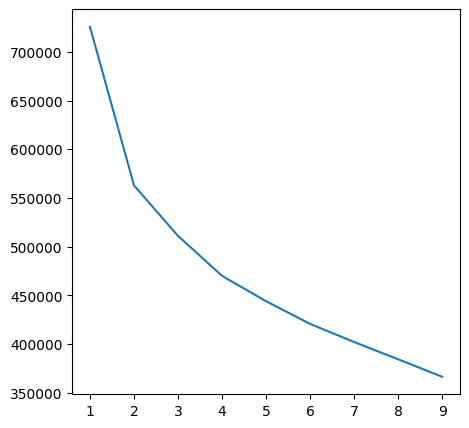

In [36]:
elbow(df_scaled)

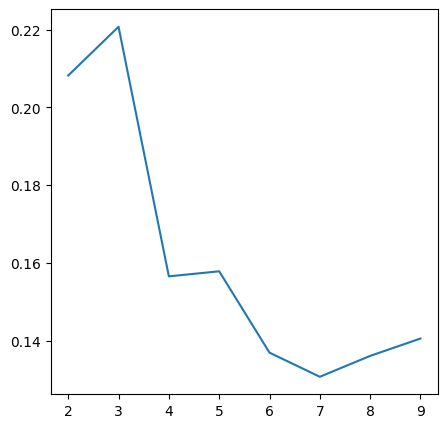

In [37]:
silhouette(df_scaled)

In [38]:
kmeans = KMeans(n_clusters=3, n_init=10, random_state=1)
model = kmeans.fit(df_scaled)

In [39]:
df_semred = df_numeric.copy()

df_semred['cluster'] = model.labels_.astype(str)

cluster_profiles2 = df_semred.groupby('cluster').agg('mean')


In [40]:
cluster_profiles2

,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,decade
cluster,,,,,,,,,,,,,,,
0,0.314635,0.879669,0.399867,258019.234516,0.199813,0.0,0.372663,5.036988,0.193508,-17.165071,0.714545,15.618440,0.049733,105.015367,1950.931522
1,0.579369,0.256315,0.535622,247424.487781,0.654798,0.0,0.067135,5.161717,0.223722,-8.773719,0.710269,40.376558,0.060731,124.020393,1978.450397
2,0.469222,0.082929,0.566180,245332.879445,0.781081,1.0,0.066581,5.368294,0.214635,-6.018773,0.616034,52.010850,0.121722,122.255780,1997.968656


O K-means sem redução de dimensionalidade conseguiu dividir-se em 3 clusters com características bastantantes diversas uns dos outros na maioria das colunas.

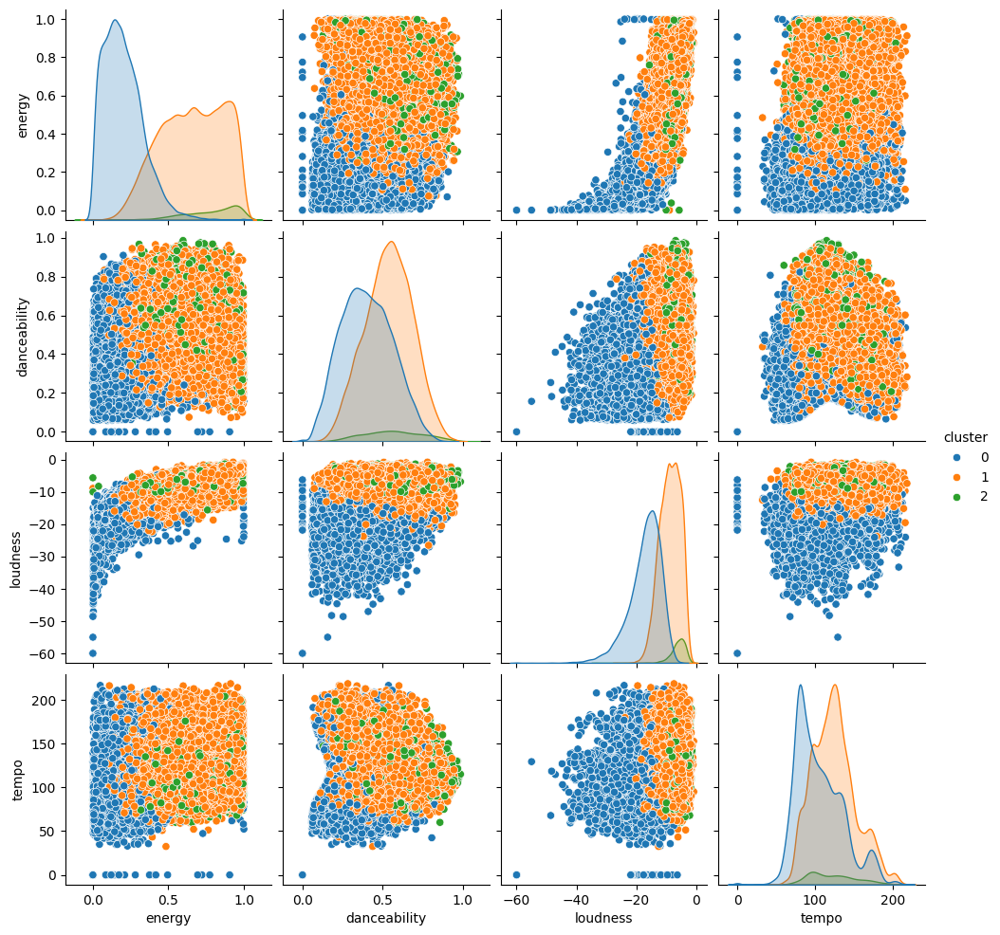

In [41]:
sns.pairplot(df_semred[["energy", "danceability", "loudness", "tempo", "cluster"]], hue="cluster")


In [42]:
df_with_genre = pd.merge(df_semred, df_final[['genre']], left_index=True, right_index=True)

cluster_genre_counts = df_with_genre.groupby(['cluster', 'genre']).size().reset_index(name='count')

cluster_genre_counts_pivot = cluster_genre_counts.pivot(index='cluster', columns='genre', values='count').fillna(0)

cluster_genre_counts_pivot


genre,adult standards,alternative metal,bebop,classical,dance pop,rock
cluster,,,,,,
0,9168.0,50.0,2900.0,8639.0,106.0,1144.0
1,5537.0,3329.0,997.0,26.0,3901.0,10926.0
2,7.0,906.0,0.0,0.0,643.0,103.0


| Cluster | Género(s) Principal(s)     | Info                                                                                                                                                                           |
|---------|-------------------------|---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| 0       | Adult Standards, Classical, Bebop | Apresenta uma mistura de música clássica e adult standard. Tem um nível acústico relativamente elevado e um nível instrumental baixo, o que sugere que contém mais faixas instrumentais e acústicas. O ritmo é moderado e a duração das canções tende a ser mais curta do que noutros clusters. |
| 1       | Rock, Alternative Metal | Caracterizado pelos géneros rock e metal alternativo. As canções deste cluster tendem a ter mais energia e maior danceability em comparação com outros. Também têm menor acústica e instrumental, indicando uma preferência por música mais energética.  |
| 2       | Alternative Metal, Dance Pop               | Constituído pela maioria das canções dance pop. Caracterizado por um ritmo e uma danceability elevados, o que indica que são faixas animadas e enérgicas, adequadas para dançar. O carácter acústico e instrumental é relativamente baixo, o que sugere que estas canções são mais electrónicas por natureza.      |


#### 2. Com PCA

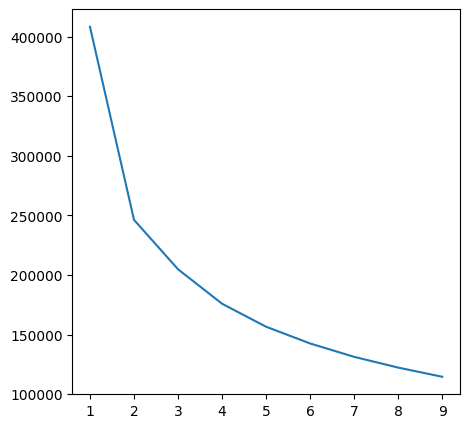

In [43]:
elbow(df_pca)

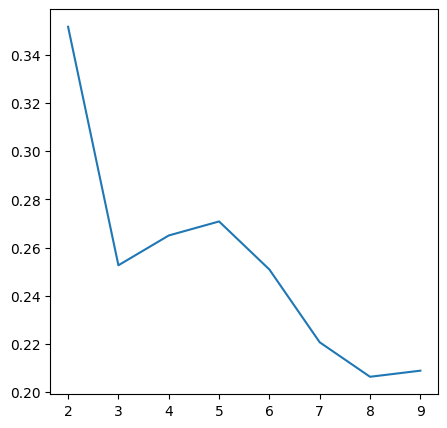

In [44]:
silhouette(df_pca)

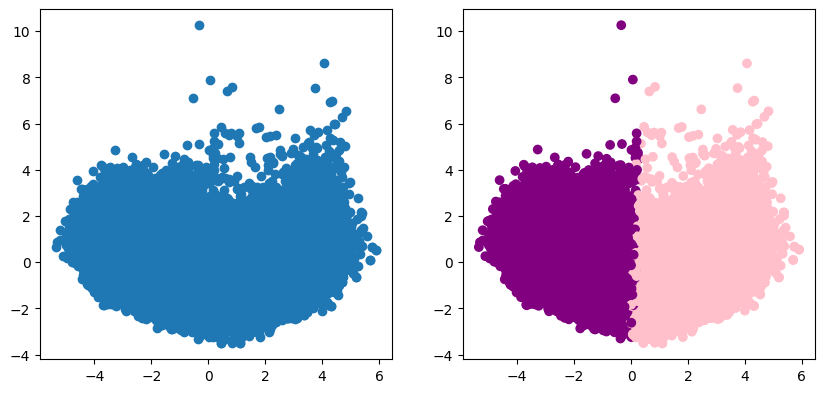

In [47]:
kmeans = KMeans(n_clusters=2, random_state=1, n_init=10)
kmeans_model = kmeans.fit(df_pca)
df_pca['cluster'] = kmeans_model.labels_.astype(str)

#colors = [category_colors[cat] for cat in df_pca["cluster"]]

category_colors = {'0': 'pink', '1': 'purple', '2': 'red','3':'yellow'}
colors = [category_colors[cat] for cat in df_pca["cluster"]]

fig = plt.figure(figsize = (10,10))
fig.add_subplot(2,2,1)
plt.scatter(df_pca["PC1"],df_pca["PC2"])
fig.add_subplot(2,2,2)
plt.scatter(df_pca["PC1"],df_pca["PC2"],color=colors)

In [48]:
df_pca_total = pd.concat([df_pca, df_numeric], axis=1)

cluster_profiles3 = df_pca_total.drop(['PC1','PC2','PC3','PC4'],axis=1).groupby('cluster').agg(['mean'])

print("Análise")
cluster_profiles3

Análise


,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,decade
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
cluster,,,,,,,,,,,,,,,
0,0.323065,0.871927,0.403642,258121.526395,0.205581,0.000221,0.366790,5.060211,0.194017,-17.036608,0.711667,15.799355,0.049742,105.438685,1951.082741
1,0.571337,0.236695,0.537595,246940.500602,0.668998,0.064245,0.064787,5.157662,0.223429,-8.503803,0.706623,41.573043,0.064922,123.999535,1980.248592


In [49]:
df_with_genre = pd.merge(df_pca, df_final[['genre']], left_index=True, right_index=True)

cluster_genre_counts = df_with_genre.groupby(['cluster', 'genre']).size().reset_index(name='count')

cluster_genre_counts_pivot = cluster_genre_counts.pivot(index='cluster', columns='genre', values='count').fillna(0)

cluster_genre_counts_pivot

genre,adult standards,alternative metal,bebop,classical,dance pop,rock
cluster,,,,,,
0,9485,56,3073,8641,115,1267
1,5227,4229,824,24,4535,10906


| Cluster | Género Principal     |                                                                                                                                                                              |
|---------|-------------------------|-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| 0       | Adult Standards, Classical, Bebop | Composto por canções mais antigas e menos populares. Canções com maior accoustic e instrumentalness. |
| 1       | Rock, Alternative Metal, Dance Pop | As músicas deste cluster têm maior energia, danceability e ritmo em comparação com outros agrupamentos. Também têm menor acústica e instrumental, indicando uma preferência por música mais energética. Sendo, mais recentes e com maior popularidade  |


Embora, não haja tanta distinção entre os géneros. O uso do PCA fez um bom trabalho a separar as musicas por idade, popularidade e energia. Mesmo que em cada cluster hajam musicas de diversos géneros, os que se encontram em maioria são semelhantes entres si.

#### 3. Com TSNE

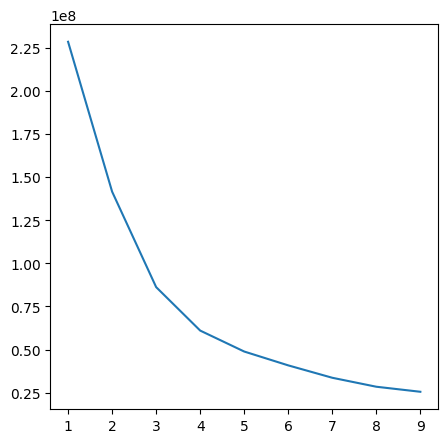

In [50]:
elbow(df_tsne)

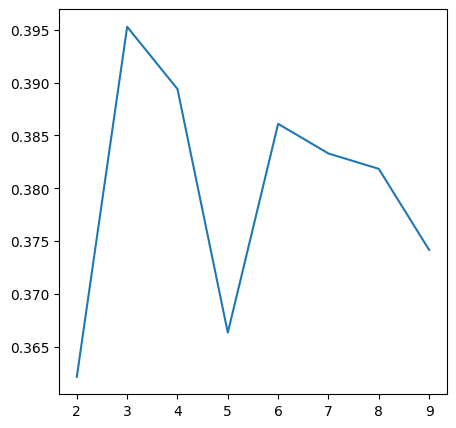

In [51]:
silhouette(df_tsne)

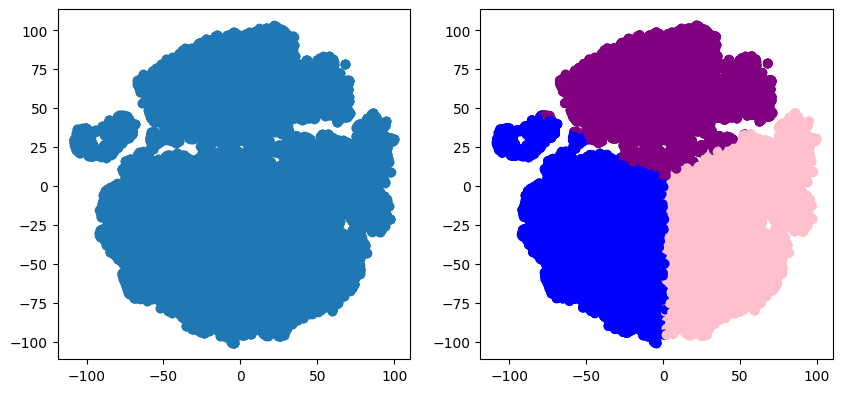

In [52]:
kmeans = KMeans(n_clusters=3, random_state=1, n_init=10)
kmeans_model = kmeans.fit(df_tsne)
df_tsne['cluster'] = kmeans_model.labels_.astype(str)

category_colors = {'0': 'pink', '1': 'purple', '2': 'blue','3':'yellow','4':'red','5':'purple','6':'brown'}
colors = [category_colors[cat] for cat in df_tsne["cluster"]]

fig = plt.figure(figsize = (10,10))
fig.add_subplot(2,2,1)
plt.scatter(df_tsne["Embedding 1"],df_tsne["Embedding 2"])
fig.add_subplot(2,2,2)
plt.scatter(df_tsne["Embedding 1"],df_tsne["Embedding 2"],color=colors)

In [53]:
df_tsne_total = pd.concat([df_tsne, df_numeric], axis=1)
df_tsne_total.drop('Embedding 1', axis=1, inplace=True)
df_tsne_total.drop('Embedding 2', axis=1, inplace=True)
df_tsne_total['cluster'] = model.labels_.astype(str)

cluster_profiles4 = df_tsne_total.groupby('cluster').agg(['mean'])
cluster_profiles4


,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,decade
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
cluster,,,,,,,,,,,,,,,
0,0.314635,0.879669,0.399867,258019.234516,0.199813,0.0,0.372663,5.036988,0.193508,-17.165071,0.714545,15.618440,0.049733,105.015367,1950.931522
1,0.579369,0.256315,0.535622,247424.487781,0.654798,0.0,0.067135,5.161717,0.223722,-8.773719,0.710269,40.376558,0.060731,124.020393,1978.450397
2,0.469222,0.082929,0.566180,245332.879445,0.781081,1.0,0.066581,5.368294,0.214635,-6.018773,0.616034,52.010850,0.121722,122.255780,1997.968656


In [54]:
df_with_genre = pd.merge(df_tsne, df_final[['genre']], left_index=True, right_index=True)

cluster_genre_counts = df_with_genre.groupby(['cluster', 'genre']).size().reset_index(name='count')

cluster_genre_counts_pivot = cluster_genre_counts.pivot(index='cluster', columns='genre', values='count').fillna(0)

cluster_genre_counts_pivot

genre,adult standards,alternative metal,bebop,classical,dance pop,rock
cluster,,,,,,
0,7632,40,1834,6104,129,952
1,4035,1232,1860,2547,1444,3624
2,3045,3013,203,14,3077,7597


O K-means quando aplicado no T-sne apresenta resultados que têm algum potencial para análise. Divindo-se em 3 clusters relativamente distintos.

| Cluster | Género Principal              | Info                                                                                                                                   |
|---------|------------------------------------|-----------------------------------------------------------------------------------------------------------------------------------------------|
| 0 | Classical, Dance Pop, Rock | Músicas com valência e dançabilidade moderadas, alta acústica e baixa energia. As canções são geralmente mais longas em duração e menos explícitas. |
| 1 | Rock, Dance Pop, Alternative Metal | Alta energia, dançabilidade e ritmo. Caracterizam-se por uma menor acústica e instrumental, indicando uma preferência por música mais energética. São mais recentes e populares. |
| 2 | Dance Pop, Classical, Bebop | Este grupo é composto por músicas com energia moderada a alta e dançantes. Apresentam menor acústica e instrumentalidade. Sendo ainda mais recentes e populares. |




Os clusters 1 e 2 são bastante semelhantes, diferindo significativamente do cluster 0. Há uma distribuição mais equilibrada do género pelos clusters - o que não é o desejado

#### 4. Com UMAP

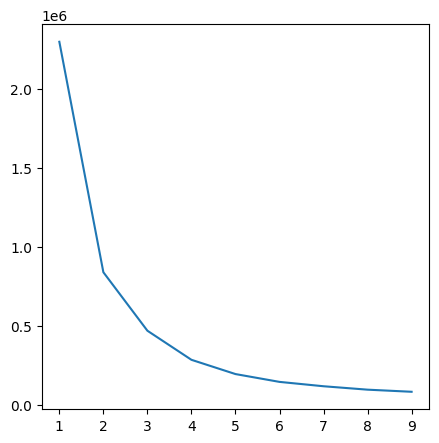

In [55]:
elbow(df_umap)

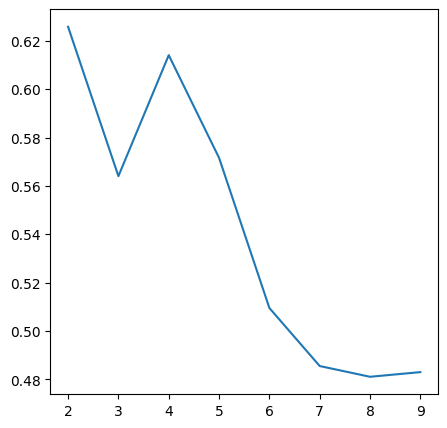

In [56]:
silhouette(df_umap)

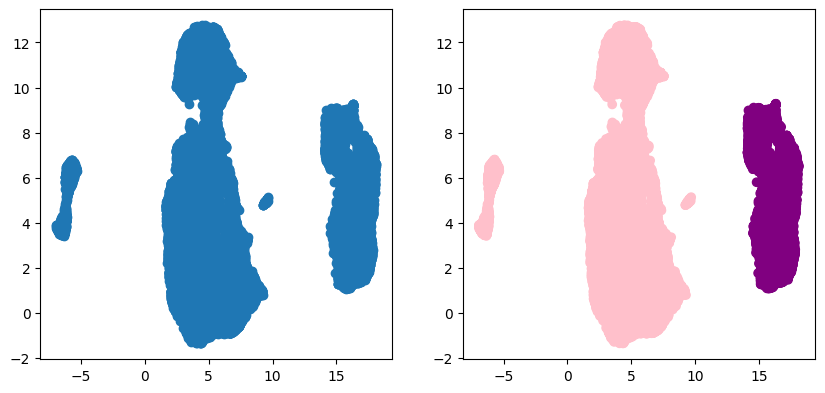

In [57]:
kmeans = KMeans(n_clusters=2, random_state=1, n_init=10)
kmeans_model = kmeans.fit(df_umap)

df_umap['cluster'] = kmeans_model.labels_.astype(str)


category_colors = {'0': 'pink', '1': 'purple'}
colors = [category_colors[cat] for cat in df_umap["cluster"]]
fig = plt.figure(figsize = (10,10))
fig.add_subplot(2,2,1)
plt.scatter(df_umap["Embedding 1"],df_umap["Embedding 2"])
fig.add_subplot(2,2,2)
plt.scatter(df_umap["Embedding 1"],df_umap["Embedding 2"],color=colors)

In [58]:
df_umap_total = pd.concat([df_umap, df_numeric], axis=1).drop(columns=["Embedding 1","Embedding 2"])

In [59]:
cluster_profiles5 = df_umap_total.groupby('cluster').agg(['mean'])

print("Análise")
(cluster_profiles5)

Análise


,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,decade
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
cluster,,,,,,,,,,,,,,,
0,0.457235,0.534353,0.471866,249671.542790,0.452649,0.047342,0.197502,4.964444,0.211913,-12.424975,0.978855,29.529806,0.058552,115.425844,1966.617869
1,0.449764,0.532737,0.482944,258740.558288,0.450927,0.000000,0.228645,5.499888,0.203769,-12.683088,0.000000,29.472599,0.055895,115.024793,1966.561961


In [60]:
df_with_genre = pd.merge(df_umap, df_final[['genre']], left_index=True, right_index=True)

cluster_genre_counts = df_with_genre.groupby(['cluster', 'genre']).size().reset_index(name='count')

cluster_genre_counts_pivot = cluster_genre_counts.pivot(index='cluster', columns='genre', values='count').fillna(0)

print(cluster_genre_counts_pivot)

genre    adult standards  alternative metal  bebop  classical  dance pop  rock
cluster                                                                       
0                  11073               3093   2204       6401       3142  9130
1                   3639               1192   1693       2264       1508  3043


O UMAP não é um bom método de redução de dimensionalidade, apresentando os piores resultados - quando aplicado cria 2 clusters quase iguais. Com uma distribuição de generos por cluster que parece aleatória.

#### Em suma...

- Obtivemos melhores resultados na separação das músicas em cluster e identificação de género musical com o Kmeans sem qualquer redução de dimensionalidade e com o PCA, tendo o 1o oferecido resultados mais especificos que o 2o, talvez pela diferenca no número de clusters. Com o Tsne, foram criados 3 clusters, com 2 sendo muito semelhantes e com o UMAP foram criados 2 clusters demasiado semelhantes.

### Hierarchal Clustering <a name="ac"></a>

#### Sem redução de dimensionalidade

In [61]:
linked = linkage(df_numeric, method='ward')

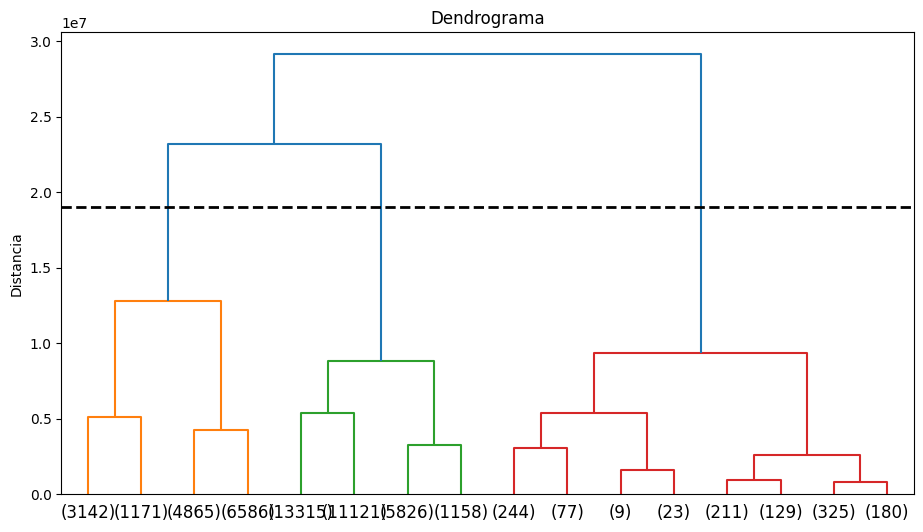

In [62]:
plt.figure(figsize=(11, 6))
dendrogram(linked, orientation='top', distance_sort='descending', truncate_mode='level', p=3, show_leaf_counts=True)
plt.axhline(y=19000000, color='black', linestyle='--', linewidth=2)
plt.title('Dendrograma')
plt.ylabel('Distancia')
plt.show()

In [63]:
clustering = AgglomerativeClustering(n_clusters=3, linkage='ward')
clustering_model = clustering.fit_predict(df_scaled)

In [64]:
df_semred2 = pd.DataFrame(df_numeric)

df_semred2['cluster'] = clustering_model.astype(str)
cluster_profiles = df_semred2.groupby('cluster').agg(['mean'])

In [65]:
cluster_profiles

,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,decade
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
cluster,,,,,,,,,,,,,,,
0,0.381036,0.779032,0.424673,251026.541960,0.285929,0.000036,0.289624,5.095271,0.232559,-15.442538,0.701277,19.502829,0.057545,109.970952,1955.028288
1,0.560693,0.219995,0.539353,254517.274151,0.663033,0.000000,0.097885,5.114308,0.176282,-8.814414,0.728094,41.980888,0.052681,122.407721,1980.551958
2,0.469440,0.082979,0.566373,244130.586852,0.781552,1.000000,0.066575,5.365501,0.214574,-6.019021,0.616405,52.016285,0.121727,122.277850,1997.973462


In [66]:
df_with_genre = pd.merge(df_semred2, df_final[['genre']], left_index=True, right_index=True)

cluster_genre_counts = df_with_genre.groupby(['cluster', 'genre']).size().reset_index(name='count')

cluster_genre_counts_pivot = cluster_genre_counts.pivot(index='cluster', columns='genre', values='count').fillna(0)

cluster_genre_counts_pivot

genre,adult standards,alternative metal,bebop,classical,dance pop,rock
cluster,,,,,,
0,11583.0,313.0,3064.0,8489.0,756.0,3369.0
1,3122.0,3067.0,833.0,176.0,3251.0,8701.0
2,7.0,905.0,0.0,0.0,643.0,103.0


Tal como no K-means, o Hierarquical Clustering cria 3 clusters com caracteristicas distintas. Porém, os 3 clusters são muito parecidos aos clusters criados pelo K-means. Os gêneros predominantes de cada cluster mantem-se iguais em proporções muito semelhantes.

#### Com PCA

In [67]:
linked = linkage(df_pca, method='ward')

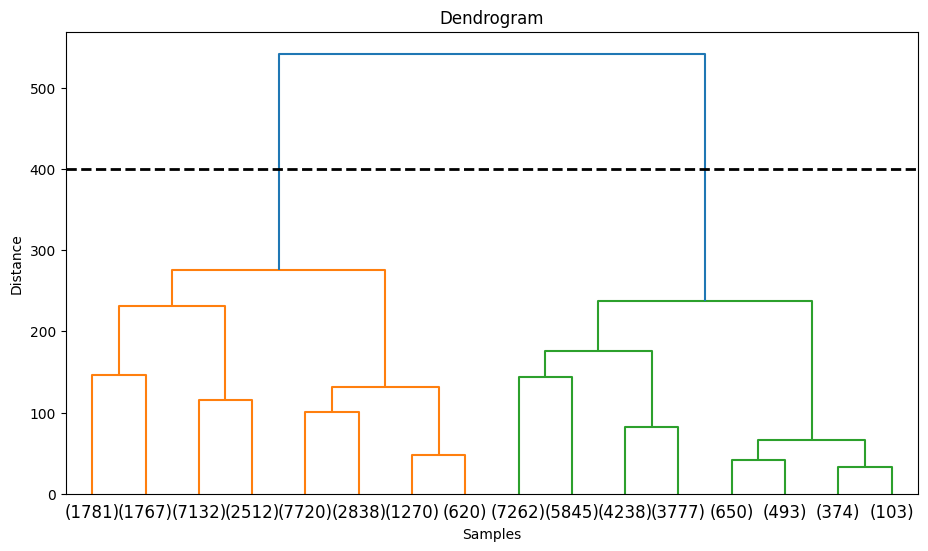

In [68]:
plt.figure(figsize=(11, 6))
dendrogram(linked, orientation='top', distance_sort='descending', truncate_mode='level', p=3, show_leaf_counts=True)
plt.title('Dendrogram')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.axhline(y=400, color='black', linestyle='--', linewidth=2)
plt.show()

In [69]:
clustering = AgglomerativeClustering(n_clusters=2, linkage='ward')
clustering_model = clustering.fit_predict(df_pca)
df_pca['cluster'] = clustering_model.astype(str)


In [70]:
fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster', title='Clusters Visualization Using PCA Components')
fig.show()

In [71]:
df_pca_total2 = pd.concat([df_pca, df_numeric], axis=1)

cluster_profiles = df_pca_total2.drop(['PC1','PC2','PC3','PC4'],axis=1).groupby('cluster').agg(['mean'])

print("Análise")
cluster_profiles

Análise


,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,decade
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
cluster,,,,,,,,,,,,,,,
0,0.351798,0.807197,0.414326,258438.677106,0.258107,0.000819,0.335406,5.098791,0.228177,-16.174168,0.698791,17.906084,0.054499,107.887447,1953.535881
1,0.571726,0.225794,0.543237,245106.520974,0.670971,0.072025,0.060292,5.127034,0.188799,-8.349416,0.720473,42.601178,0.061564,123.689623,1981.334096


In [72]:
df_with_genre = pd.merge(df_pca_total2, df_final[['genre']], left_index=True, right_index=True)

cluster_genre_counts = df_with_genre.groupby(['cluster', 'genre']).size().reset_index(name='count')

cluster_genre_counts_pivot = cluster_genre_counts.pivot(index='cluster', columns='genre', values='count').fillna(0)

cluster_genre_counts_pivot

genre,adult standards,alternative metal,bebop,classical,dance pop,rock
cluster,,,,,,
0,10325,266,3271,8645,229,2904
1,4387,4019,626,20,4421,9269


Podemos, observar que a divisão dos clusters não ficou tão equilibrada como no kmeans com PCA.

#### Com T-SNE

In [73]:
linked2 = linkage(df_tsne, method='ward')

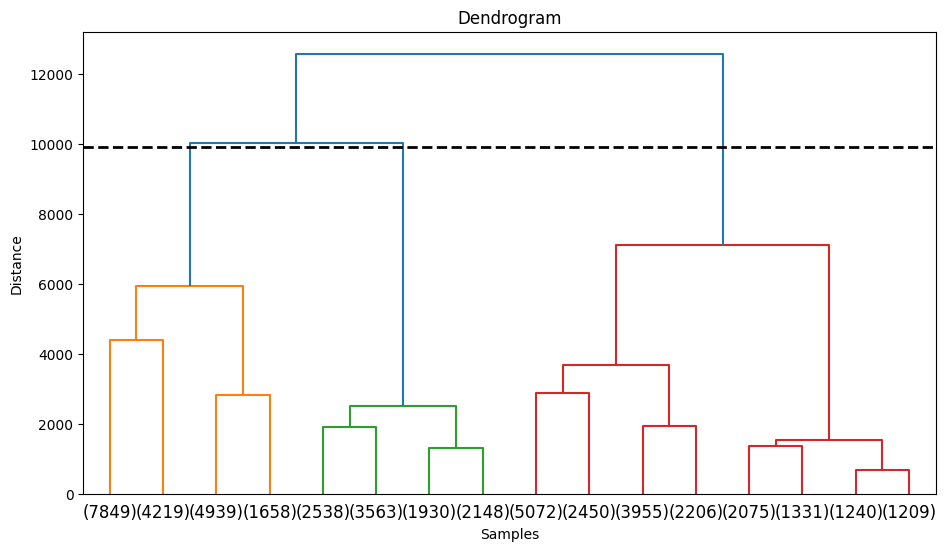

In [74]:
plt.figure(figsize=(11, 6))
dendrogram(linked2, orientation='top', distance_sort='descending', truncate_mode='level', p=3, show_leaf_counts=True)
plt.title('Dendrogram')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.axhline(y=9898, color='black', linestyle='--', linewidth=2)
plt.show()

In [75]:
clustering = AgglomerativeClustering(n_clusters=3, linkage='ward')
clustering_model = clustering.fit_predict(df_tsne)

In [76]:
fig = px.scatter(df_tsne, x='Embedding 1', y='Embedding 2', color='cluster', title='Clusters Visualization Using Tsne Embeding')
fig.show()

In [77]:
df_tsne_total_2 = pd.concat([df_tsne, df_numeric], axis=1)

cluster_profiles = df_tsne_total_2.drop(['Embedding 1', 'Embedding 2'],axis=1).groupby('cluster').agg(['mean'])

print("Análise")
cluster_profiles

Análise


,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,decade
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
cluster,,,,,,,,,,,,,,,
0,0.347769,0.861960,0.408244,251798.495656,0.220109,0.000000,0.338632,5.009586,0.176546,-16.452327,0.999940,17.283266,0.046322,106.617139,1952.315619
1,0.445981,0.536377,0.477370,265258.278388,0.454390,0.002171,0.227795,5.532357,0.251101,-12.775213,0.097205,28.618098,0.064396,115.411474,1965.766517
2,0.568944,0.208701,0.538452,241157.233465,0.678779,0.095994,0.056682,4.847425,0.206247,-8.357432,0.954570,42.337896,0.063422,123.797329,1981.398903


In [78]:
df_with_genre = pd.merge(df_tsne_total_2, df_final[['genre']], left_index=True, right_index=True)

cluster_genre_counts = df_with_genre.groupby(['cluster', 'genre']).size().reset_index(name='count')

cluster_genre_counts_pivot = cluster_genre_counts.pivot(index='cluster', columns='genre', values='count').fillna(0)

cluster_genre_counts_pivot

genre,adult standards,alternative metal,bebop,classical,dance pop,rock
cluster,,,,,,
0,7632,40,1834,6104,129,952
1,4035,1232,1860,2547,1444,3624
2,3045,3013,203,14,3077,7597


Uma distribuição de géneros demasiado geral pelos clusters - tal como obtido no kmeans: não é a melhor abordagem.

#### Em suma...

Com o hierarquical clustering os resultados diferem ligeiramente em comparação ao k-means:

- Sem redução de dimensionalidade os resultados são identicos, sendo que com base na contagem de músicas com base nos géneros o kmeans parece obter maiores números de músicas de um género no cluster "esperado".

- Com PCA, observou-se que o hierarquical clustering não conseguiu criar clusters tão distintos como o k-means.

- Com T-SNE o resultado mantém-se com clusters pouco diferenciados.

## Curiosidade: Criar uma Playlist<a name="c"></a>

Recorremos ao kmeans sem qualquer redução de dimensionabilidade, uma vez que foi com este que obtemos os melhores resultados.

In [79]:
def create_playlist(song_name, artist_name, n_songs):
 
    if song_name not in df_final['name'].values:
        print("The song ", song_name, "is not in our database.")
        return None
    
    artist_songs = df_final[(df_final['artist'] == artist_name) & (df_final['name'] != song_name)]
    
    if len(artist_songs) == 0:
        print("There are no songs by ", artist_name," in our database.")
        return None
    
    kmeans = KMeans(n_clusters=3, n_init=10, random_state=1)
    model = kmeans.fit(df_scaled)
    cluster = model.predict(df_scaled[df_final['name'] == song_name])[0]
    
    cluster_songs = df_final[model.labels_ == cluster]
    
    artist_songs_in_cluster = cluster_songs[(cluster_songs['artist'] == artist_name) & (cluster_songs['name'] != song_name)]

    artist_songs_in_cluster = artist_songs_in_cluster.sample(frac=1) #100% das musicas mas de forma aleatoria
    
    num_artist_songs = round(n_songs/2)
    num_other_songs = n_songs - num_artist_songs
    
    playlist_artist = artist_songs_in_cluster.head(num_artist_songs)
    other_songs = cluster_songs[~cluster_songs.index.isin(artist_songs_in_cluster.index)].sample(num_other_songs)
    playlist_other = other_songs.sample(n=num_other_songs)
    
    playlist = pd.concat([playlist_artist, playlist_other])
    
    playlist['cluster'] = cluster
    
    return playlist

#impede que mais de metade sejam do mesmo artista -> aconteceu a musica escolhida ser do frank sinatra entao toda a playlist era dele


In [80]:
random_song = df_final['name'].sample(frac=1).iloc[0]
random_song_artist = df_final.loc[df_final['name'] == random_song, 'artist'].iloc[0]

create_playlist(random_song, random_song_artist, 10)

,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artist,genre,decade,cluster
38810,0.4400,0.779,0.593,220493,0.25600,0,0.000587,2,0.1090,-13.953,1,Rock Me On The Water,24,0.0349,106.616,Linda Ronstadt,adult standards,1970,0
39953,0.0966,0.446,0.235,282093,0.26500,0,0.000036,4,0.0992,-15.967,1,Dreams To Dream (Finale Version) - Fievel Goes...,29,0.0306,99.676,Linda Ronstadt,adult standards,1990,0
10061,0.2720,0.795,0.427,263400,0.19200,0,0.000003,9,0.3140,-14.611,1,Long Long Time,46,0.0285,91.088,Linda Ronstadt,adult standards,1960,0
21697,0.1530,0.804,0.256,209600,0.05020,0,0.000006,1,0.1100,-23.262,1,I've Got a Crush on You,35,0.0373,177.027,Linda Ronstadt,adult standards,1980,0
40089,0.2960,0.622,0.566,290507,0.09320,0,0.000045,0,0.1180,-16.241,1,Feels Like Home,40,0.0290,98.961,Linda Ronstadt,adult standards,1990,0
36849,0.1650,0.940,0.571,125973,0.25200,0,0.003010,0,0.1880,-9.899,0,"Verdi : La forza del destino : Act 3 ""Al tradi...",0,0.2070,81.188,Giuseppe Verdi,classical,1940,0
33060,0.1960,0.987,0.391,224187,0.03400,0,0.331000,0,0.2060,-24.944,1,III. Andante grazioso,1,0.0358,74.720,Johannes Brahms,classical,1950,0
26273,0.0911,0.981,0.208,136400,0.00875,0,0.969000,10,0.0756,-37.230,1,"Le Carnaval des Animaux, R.125: 4. Tortues",37,0.0361,83.036,Camille Saint-Saëns,classical,1970,0
41121,0.1200,0.968,0.340,153800,0.23000,0,0.351000,2,0.6780,-18.064,1,Le Chant du Rossignol - Poème symphonique: 1. ...,0,0.0533,137.394,Igor Stravinsky,classical,1940,0
1980,0.2070,0.969,0.326,183200,0.02770,0,0.226000,10,0.1140,-20.470,1,Tarra Ta-Larra Ta-Lar,16,0.0369,109.681,Dean Martin,adult standards,1940,0


In [81]:
create_playlist("Highway to Hell", "AC/DC", 5)

,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artist,genre,decade,cluster
16759,0.544,0.001260,0.466,253400,0.943,0,0.607000,0,0.4240,-4.551,1,Sink the Pink,43,0.0533,123.796,AC/DC,rock,1980,1
26058,0.550,0.000113,0.391,280933,0.955,0,0.250000,7,0.9830,-3.870,1,"Problem Child - Live at the Apollo Theatre, Gl...",39,0.0892,138.966,AC/DC,rock,1970,1
6641,0.768,0.013500,0.496,224133,0.859,0,0.065000,5,0.3490,-7.927,0,"Paint It, Black - (Original Single Mono Version)",62,0.0934,159.694,The Rolling Stones,rock,2000,1
21243,0.964,0.055600,0.656,164173,0.713,0,0.787000,11,0.0644,-8.831,0,Head for Backstage Pass,36,0.0596,131.493,Jeff Beck,rock,1970,1
17787,0.770,0.064800,0.737,244840,0.820,0,0.000305,2,0.2850,-3.808,1,Lowlife (Living the Highlife),49,0.0351,115.043,Kid Rock,alternative metal,2000,1


Assim foi criada uma função que recebe uma música e retorna outras semelhantes. Esta implementação foi facilitada pelo uso do kmeans e de clusters que permitem um "pré agrupamento" das músicas com base em semelhanças nos seus features - no nosso dataset existem mais músicas de certos género do que outros e por isso a qualidade das playlists encontra-se ligeiramente dependente da música escolhida. Importante notar que esta função procura sempre músicas do mesmo artista no cluster, assim mesmo que outras músicas não tenham tanto em comum com a inicial provavelmente terão features semelhantes com pelo menos uma do mesmo artista.

## Conclusão<a name="conclusion"></a>

- O algoritmo que mostrou melhores resultados na separação das músicas por géneros musicais em clusters foi o kmeans sem qualquer redução de dimensionalidade - criou 3 clusters com perfis musicais diferentes entre si. Importante salientar que com Agglomerative Clustering foram obtidos resultados muito semelhantes aos obtidos com kmeans mas ligeiramente piores na separação dos géneros.

- De todos os géneros o mais fácil de identifcar foi a música clássica, tendo uns features mais únicos em comparção aos restantes features no dataset. Enquanto a mais dificil foi o alternative metal, que apresenta features que variam significativamente de música para música, tendo algumas maiores semelhanças com pop , outras com rock e outras com adult standards.

- Foi ainda possivel criar uma função de criação de playlists com base nos clusters obtidos, esta implementação embora não perfeita pode ser considerada viável.